In [1]:
import sys
import pandas
import numpy
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from matplotlib import pyplot as plt
import  plotly.express  as px
from sklearn.naive_bayes import MultinomialNB
from scipy import stats
sys.version

'3.11.3 (tags/v3.11.3:f3909b8, Apr  4 2023, 23:49:59) [MSC v.1934 64 bit (AMD64)]'

In [2]:
# text_file = open("stopWords.txt", "r", encoding='utf-8')
# stopWords=(list(map(lambda x: x.strip().lower(),text_file.readlines())))
# # print(stopwords)

csv=pandas.read_csv("./dataset.csv",sep=";")

# def removeStopWords(txt):
#     return " ".join([word for word in txt.split() if word.lower() not in stopWords])


# # print(removeStopWords('test zwischen'))
# csv["review_body"]=csv["review_body"].apply(lambda x: removeStopWords(x))
csv



,review_body,Results,Value
0,Das Produkt kam bis heute nicht bei mir an. Ic...,1,NaN
1,"Gebrauchte Spinner, teilzerlegt und teilweise ...",1,NaN
2,Bei beiden Bestellungen war jeweils eine Glühb...,1,NaN
3,Sofort zurückgeschickt,1,NaN
4,wie man auf den Fotos erkennen kann ist das Gl...,1,NaN
...,...,...,...
4995,Habe es nach Anleitung verwendet und bin mehr ...,5,NaN
4996,"Sehr schnelle Lieferung , Super Preis Leistung...",5,NaN
4997,wie soll ich das Panzerglas beschreiben. Fast ...,5,NaN
4998,"Alles einwandfrei, Lieferung, Produkt und Serv...",5,NaN


In [3]:
# create the transform
vectorizerCount = CountVectorizer()
# tokenize and build vocab
vectorizerCount.fit(csv["review_body"])
# summarize
#print(vectorizerCount.vocabulary_)

# sample text
text = ["The quick brown fox jumped over the lazy dog."]


# encode document
vector = vectorizerCount.transform(text)
# summarize encoded vector
print(f"shape: {vector.shape}")
print(f"type of a vector: {type(vector)}")
print(f"Vector array {numpy.array(vector.toarray()[0])}")




shape: (1, 15163)
type of a vector: <class 'scipy.sparse._csr.csr_matrix'>
Vector array [0 0 0 ... 0 0 0]


In [4]:
# create the transform
vectorizerTfidf = TfidfVectorizer()
# tokenize and build vocab
vectorizerTfidf.fit(csv["review_body"])
# summarize
print(vectorizerTfidf.vocabulary_)
print(vectorizerTfidf.idf_)

# sample texts
text = ["The quick brown fox jumped over the lazy dog.",
		"The dog.",
		"The fox"]


# encode document
vector = vectorizerTfidf.transform([text[0]])
# summarize encoded vector
print(vector.shape)
print(vector.toarray())

{'das': 2769, 'produkt': 10057, 'kam': 7007, 'bis': 2237, 'heute': 6350, 'nicht': 9310, 'bei': 1815, 'mir': 8793, 'an': 655, 'ich': 6673, 'bin': 2222, 'stocksauer': 12204, 'trotz': 12863, 'der': 2894, 'langen': 7909, 'lieferzeit': 8213, 'sollte': 11770, 'zwischen': 14944, 'dem': 2866, 'und': 13067, '10': 8, 'märz': 9036, 'geliefert': 5227, 'werde': 14245, 'ist': 6871, 'auch': 1077, 'eine': 3440, 'woche': 14423, 'nach': 9085, 'spätesten': 11981, 'lieferdatum': 8197, 'angekommen': 744, 'gebrauchte': 5014, 'spinner': 11916, 'teilzerlegt': 12546, 'teilweise': 12545, 'mit': 8813, 'bereits': 1942, 'oxidierten': 9597, 'fingerabdrücken': 4532, 'foto': 4673, 'auf': 1083, 'metall': 8699, 'ekelhaft': 3704, 'beiden': 1818, 'bestellungen': 2054, 'war': 14032, 'jeweils': 6923, 'glühbirne': 5760, 'defekt': 2839, 'von': 13857, 'qualität': 10187, 'kann': 7023, 'dar': 2748, 'keine': 7120, 'rede': 10381, 'sein': 11472, 'sofort': 11736, 'zurückgeschickt': 14817, 'wie': 14320, 'man': 8471, 'den': 2875, 'fo

In [5]:
def transformTextToWordArray(txt):
    ret=[]
    for count in vectorizerTfidf.transform([txt]).toarray()[0]:
        ret.append(count)
    return ret
print(transformTextToWordArray("10 von Zehn "))

[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5218429333167861, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,

In [6]:



reviewWordCounts=[]
for i in range(len(csv)):
    # tmp=[]
    # for count in vectorizerCount.transform([csv["review_body"][i]]).toarray()[0]:
    #     tmp.append(count)
    reviewWordCounts.append(transformTextToWordArray(csv["review_body"][i]))

reviewWordCounts


[[0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.17772935176937862,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.

In [7]:
X_train, X_test, Y_train, Y_test = train_test_split(numpy.array(reviewWordCounts), csv['Results'].to_numpy(), test_size=0.2, random_state=42)

X_test

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [8]:
model = LinearRegression()
model.fit(X_train, Y_train)

LinearRegression()

In [9]:
predictions=model.predict(X_test)
predictions

array([ 9.14690877e+11,  8.15461208e+11, -7.75716402e+11, -5.00431212e+11,
        4.90975142e+11, -9.40235982e+10, -2.44524387e+12, -5.80727645e+11,
       -1.24766704e+12, -1.20931466e+12,  1.05929599e+12, -1.85329962e+11,
       -1.65327584e+12, -4.78026716e+11,  6.11690932e+11,  7.89943123e+11,
       -1.92971385e+11, -1.09495545e+12, -1.21864731e+12,  2.97806944e+11,
       -5.59446695e+10, -5.25247883e+11, -6.40149997e+11,  5.01118748e+11,
        1.05333885e+12, -7.53603464e+00,  9.09600075e+11,  6.71081412e+11,
       -1.50051287e+12,  3.63497523e+12,  4.31627820e+11, -3.48740651e+11,
       -1.01512767e+11,  2.96268125e+12, -1.73223577e+12, -5.26479252e+11,
        2.20471574e+11,  1.00246043e+11, -6.98122488e+11,  1.11154760e+11,
        3.64893491e+10, -1.29877133e+12, -9.83078725e+11, -4.10935560e+11,
       -2.81281677e+11,  2.17019430e+11, -1.44598843e+12,  6.69902078e+11,
        6.32246512e+11, -2.51944042e+10,  1.26562719e+12, -6.75479127e+11,
        9.60193859e+11,  

In [10]:
mse=numpy.mean((predictions-Y_test)**2)
print(f"Linear Regression Mean Squared Error: {mse}")

df=pandas.DataFrame()
df["predictions"]=predictions
df["Y_test"]=Y_test


    
# Linear Regression ist wahrscheinlich echt ein schlechtes Modell für das Problem, da die Werte so weit voneinander entfern sind!
df

Linear Regression Mean Squared Error: 1.5915404470988766e+24


,predictions,Y_test
0,9.146909e+11,2
1,8.154612e+11,3
2,-7.757164e+11,3
3,-5.004312e+11,2
4,4.909751e+11,1
...,...,...
995,8.867969e+11,5
996,9.808694e+11,3
997,2.063350e+11,4
998,1.629124e+12,3


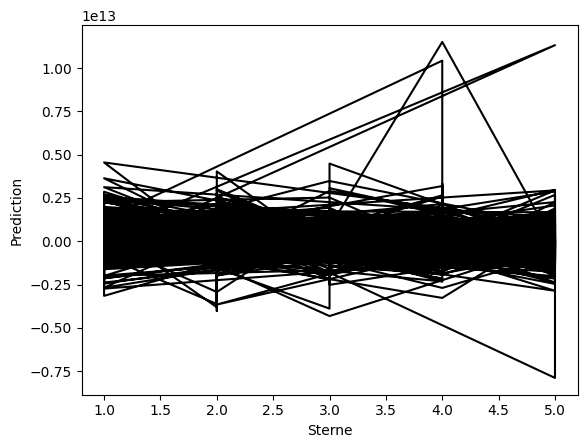

5

In [11]:

#plt.scatter(X_test, Y_test,color='g')
plt.plot(Y_test, predictions,color='k')
plt.xlabel("Sterne")
plt.ylabel("Prediction")

plt.show()

numpy.max(Y_test)

In [12]:
nb = MultinomialNB()
nb.fit(X_train, Y_train)

MultinomialNB()

In [13]:
Y_predict = nb.predict(X_test)
df=pandas.DataFrame()
df["predictions"]=Y_predict
df["Y_test"]=Y_test
print(df)

# plt.scatter(Y_test, Y_predict,color='k')
# plt.xlabel("Sterne")
# plt.ylabel("Prediction")

# plt.show()

# plt.imshow([Y_test,Y_predict], cmap='hot', interpolation='nearest')
# plt.show()
kernel=stats.gaussian_kde([df["predictions"],df["Y_test"]])
df["z"]=kernel([df["predictions"],df["Y_test"]])

fig=px.scatter(df,x=df["predictions"],y=df["Y_test"],color="z",color_continuous_scale=px.colors.sequential.Bluered)
fig.update_layout(xaxis_title="predictions",yaxis_title="Ratings")
fig.show()

mse=numpy.mean((Y_predict-Y_test)**2)
print(f"Mean Squared Error: {mse}")

     predictions  Y_test
0              2       2
1              4       3
2              3       3
3              1       2
4              1       1
..           ...     ...
995            4       5
996            2       3
997            4       4
998            2       3
999            2       2

[1000 rows x 2 columns]


Mean Squared Error: 1.317


In [14]:
userInput="none"
while userInput:
    
    userInput=input("Enter a review to rate:")  
    for i in range(130):
        print(" ",end="")
    print("",end="\r")  
    print(f"{nb.predict([transformTextToWordArray(userInput)])[0]} - {userInput}", flush=True, end="\r")